<a id='Q0'></a>
<center> <h1> Notebook 2: Advanced Visualization </h1> </center>
<p style="margin-bottom:1cm;"></p>
<center><strong>Angela Niederberger, 2022</strong></center>
<p style="margin-bottom:1cm;"></p>

<div style="background:#EEEDF5;border-top:0.1cm solid #EF475B;border-bottom:0.1cm solid #EF475B;">
    <div style="margin-left: 0.5cm;margin-top: 0.5cm;margin-bottom: 0.5cm;color:#303030">
        <p><strong>Goal:</strong> Short description of the aim of the notebook</p>
        <strong> Outline:</strong>
        <a id='P0' name="P0"></a>
        <ol>
            <li> <a style="color:#303030" href='#I'>Introduction </a> </li>
            <li> <a style="color:#303030" href='#SU'>Set up</a></li>
            <li> <a style="color:#303030" href='#P1'>Exploratory Data Analysis</a></li>
            <li> <a style="color:#303030" href='#P2'>Visualization</a></li>
            <li> <a style="color:#303030" href='#P3'>Part 3</a></li>
            <li> <a style="color:#303030" href='#CL'>Conclusion</a></li>
            <li> <a style="color:#303030" href='#AP'>Appendix</a></li>
        </ol>
        <strong>Keywords:</strong> data cleaning, NLP, ... list of keywords.
    </div>
</div>
</nav>

<a id='I' name="I"></a>
## [Introduction](#P0)

Here you could write an introduction to the topics. Everything that is written here will appear in the live coding template notebook

<a id='SU' name="SU"></a>
## [Set up](#P0)

### Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import os
import json

### Magic Commands

In [2]:
%load_ext lab_black
%matplotlib inline
%config Completer.use_jedi = False

### Global Parameters Setting

In [3]:
plt.style.use("seaborn")
sns.set_theme(style="ticks")

### User-Dependent Variables

In [4]:
raw_data = "../data/raw"
proc_data = "../data/processed"
mapbox_access_token = open("../.mapbox_token").read()
quali_colorscale = px.colors.qualitative.Bold

os.getcwd()

'/home/angela/Documents/Python/swiss_rents/notebooks'

### Helper Functions

Some helpful functions either from the previous notebook or from elsewhere.

In [5]:
def clean_swiss_rents_data(df):
    # Turn PLZ_Ort into two independent columns
    df["Ort"] = df["PLZ_Ort"].str.split(" ", 1).str[1]
    df["PLZ"] = df["PLZ_Ort"].str.split(" ", 1).str[0].astype("int")

    # Remove all the unnecessary commas in KT
    df["KT,"] = df["KT,"].str.replace(",", "")
    df.rename(columns={"KT,": "KT"}, inplace=True)

    # Turn KT into actual Canton name
    cantons_dict = {
        "TG": "Thurgau",
        "GR": "Graubünden",
        "LU": "Luzern",
        "BE": "Bern",
        "VS": "Valais",
        "BL": "Basel-Landschaft",
        "SO": "Solothurn",
        "VD": "Vaud",
        "SH": "Schaffhausen",
        "ZH": "Zürich",
        "AG": "Aargau",
        "UR": "Uri",
        "NE": "Neuchâtel",
        "TI": "Ticino",
        "SG": "St. Gallen",
        "GE": "Genève",
        "GL": "Glarus",
        "JU": "Jura",
        "ZG": "Zug",
        "OW": "Obwalden",
        "FR": "Fribourg",
        "SZ": "Schwyz",
        "AR": "Appenzell Ausserrhoden",
        "AI": "Appenzell Innerrhoden",
        "NW": "Nidwalden",
        "BS": "Basel-Stadt",
    }
    df["Kanton"] = df["KT"].map(cantons_dict)

    return df

In [6]:
def create_new_features(df):
    # Add rent categories
    df["sqm_preis"] = df["Mietpreis_Brutto"] / df["Fläche"]
    descr_rents = df["sqm_preis"].describe()

    quantiles = df["sqm_preis"].quantile(q=[0.15, 0.5, 0.85])
    cheap = quantiles[0.15]
    average = quantiles[0.5]
    expensive = quantiles[0.85]

    df["Miete_Kategorie"] = np.where(
        df["sqm_preis"] < cheap,
        0,
        np.where(
            (df["sqm_preis"] >= cheap) & (df["sqm_preis"] < average),
            1,
            np.where(
                (df["sqm_preis"] >= average) & (df["sqm_preis"] < expensive),
                2,
                3,
            ),
        ),
    )

    # Hover strings
    df["hover_strings_scatter"] = [
        f"Address: {street}, {place},<br>Rooms: {rooms}, Floor Space: {round(size)}m²,<br>Rent: CHF {rent}"
        for street, place, rooms, size, rent in zip(
            df["Adresse"],
            df["Ort"],
            df["Zimmer"],
            df["Fläche"],
            df["Mietpreis_Brutto"],
        )
    ]

    return df

<a id='P2' name="P2"></a>
## [Data Pre-processing](#P0)

This section shows the preparations required to get a clean dataset, which can then be used for advanced visualizations with Plotly.

### Loading the Data

In [7]:
rents_df = pd.read_csv(f"{raw_data}/mietinserate_v1.csv", sep=";")
rents_df = clean_swiss_rents_data(rents_df)
rents_df.head()

,ID,Jahr,Quartal,Wohnungstyp,Zimmer,Fläche,Mietpreis_Brutto,Quadratmeterpreis_Brutto,Adresse,PLZ_Ort,Bezugsdatum,GKODE,GKODN,KT,Ort,PLZ,Kanton
0,1,2019,4,Wohnung,4.5,NaN,1850,NaN,Aachstrasse 13,9327 Tübach,NaN,2752059.0,1261281.0,SG,Tübach,9327,St. Gallen
1,2,2019,2,Wohnung,3.5,75.0,1180,16.0,Aachstrasse 29,8586 Erlen,NaN,2734483.0,1268102.0,TG,Erlen,8586,Thurgau
2,3,2019,4,Maisonettewohnung,3.5,NaN,1400,NaN,Aachstrasse 31b,8586 Erlen,NaN,2734427.0,1268073.0,TG,Erlen,8586,Thurgau
3,4,2019,2,Wohnung,4.5,NaN,1750,NaN,Aachstrasse 5,9327 Tübach,NaN,2751994.0,1261267.0,SG,Tübach,9327,St. Gallen
4,5,2019,2,Wohnung,5.5,NaN,2450,NaN,Aachstrasse 5,9327 Tübach,NaN,2751994.0,1261267.0,SG,Tübach,9327,St. Gallen


### Converting Coordinates

The following script was used to request GPS coordinates from the swisstopo API. They are based on the coordinates ``GKODE`` and ``GKODN`` which are coordinates on a Swiss system (LV95). The loop takes 2-3 hours to complete, so I've commented this code out.

In [8]:
"""
long = []
lat = []

for i in range(len(rents_df)):    
    r = requests.get(f'http://geodesy.geo.admin.ch/reframe/lv95towgs84?easting={rents_df.loc[i, "GKODE"]}&northing={rents_df.loc[i, "GKODN"]}&format=json')
    coord_dict = json.loads(r.content)
    long.append(coord_dict["easting"])
    lat.append(coord_dict["northing"])
    
rents_df["long"] = long
rents_df["lat"] = lat
"""

'\nlong = []\nlat = []\n\nfor i in range(len(rents_df)):    \n    r = requests.get(f\'http://geodesy.geo.admin.ch/reframe/lv95towgs84?easting={rents_df.loc[i, "GKODE"]}&northing={rents_df.loc[i, "GKODN"]}&format=json\')\n    coord_dict = json.loads(r.content)\n    long.append(coord_dict["easting"])\n    lat.append(coord_dict["northing"])\n    \nrents_df["long"] = long\nrents_df["lat"] = lat\n'

The coordinates were saved in the file that I'm loading below. I'll just transfer them into the dataframe created before, for the sake of simplicity.

In [9]:
df_proc_old = pd.read_csv(f"{proc_data}/rents_with_coords.csv")

In [10]:
rents_df["lon"] = df_proc_old["long"]
rents_df["lat"] = df_proc_old["lat"]
rents_df

,ID,Jahr,Quartal,Wohnungstyp,Zimmer,Fläche,Mietpreis_Brutto,Quadratmeterpreis_Brutto,Adresse,PLZ_Ort,Bezugsdatum,GKODE,GKODN,KT,Ort,PLZ,Kanton,lon,lat
0,1,2019,4,Wohnung,4.5,NaN,1850,NaN,Aachstrasse 13,9327 Tübach,NaN,2752059.0,1261281.0,SG,Tübach,9327,St. Gallen,9.456363,47.484699
1,2,2019,2,Wohnung,3.5,75.0,1180,16.0,Aachstrasse 29,8586 Erlen,NaN,2734483.0,1268102.0,TG,Erlen,8586,Thurgau,9.225286,47.549861
2,3,2019,4,Maisonettewohnung,3.5,NaN,1400,NaN,Aachstrasse 31b,8586 Erlen,NaN,2734427.0,1268073.0,TG,Erlen,8586,Thurgau,9.224534,47.549611
3,4,2019,2,Wohnung,4.5,NaN,1750,NaN,Aachstrasse 5,9327 Tübach,NaN,2751994.0,1261267.0,SG,Tübach,9327,St. Gallen,9.455496,47.484588
4,5,2019,2,Wohnung,5.5,NaN,2450,NaN,Aachstrasse 5,9327 Tübach,NaN,2751994.0,1261267.0,SG,Tübach,9327,St. Gallen,9.455496,47.484588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56772,56773,2019,2,Wohnung,1.5,33.0,589,18.0,Zwyssigstrasse 16,9000 St. Gallen,01.07.2019,2743972.0,1254111.0,SG,St. Gallen,9000,St. Gallen,9.346783,47.422052
56773,56774,2019,4,Wohnung,1.5,72.0,1650,23.0,Zyböriweg 6,6004 Luzern,01.11.2019,2665419.0,1212018.0,LU,Luzern,6004,Luzern,8.299682,47.055962
56774,56775,2019,2,Wohnung,5.5,120.0,2000,17.0,Zylistrasse 10,9000 St. Gallen,01.06.2019,2745058.0,1253669.0,SG,St. Gallen,9000,St. Gallen,9.361027,47.417839
56775,56776,2019,2,Wohnung,2.5,NaN,1170,NaN,Zylistrasse 10,9000 St. Gallen,01.04.2019,2745058.0,1253669.0,SG,St. Gallen,9000,St. Gallen,9.361027,47.417839


### Handling Missing Values

Missing values can create problems when plotting, so they are either filled or removed below. I'm also dropping columns that will not be useful.

In [11]:
cols_to_drop = [
    "ID",
    "Jahr",
    "Quartal",
    "Wohnungstyp",
    "Quadratmeterpreis_Brutto",
    "PLZ_Ort",
    "Bezugsdatum",
    "GKODE",
    "GKODN",
    "KT",
]

rents_df.drop(columns=cols_to_drop, inplace=True)
rents_df.dropna(inplace=True)
print(rents_df.shape)
rents_df.head()

(48393, 9)


,Zimmer,Fläche,Mietpreis_Brutto,Adresse,Ort,PLZ,Kanton,lon,lat
1,3.5,75.0,1180,Aachstrasse 29,Erlen,8586,Thurgau,9.225286,47.549861
9,4.5,80.0,1500,Aachstrasse 9,Tübach,9327,St. Gallen,9.455497,47.484957
11,4.0,105.0,1500,Aadorferstrasse 14,Wängi,9545,Thurgau,8.950226,47.496106
12,3.0,34.0,1400,Aadorferstrasse 34,Matzingen,9548,Thurgau,8.928612,47.518191
13,3.5,131.0,2220,Aarauerstrasse 1,Schönenwerd,5012,Solothurn,8.003198,47.372433


### Rows with Errors

Some rows have errors or inconsistencies, like for example if the place is 'Zürich' but the canton is 'Bern'. We need to remove these.

In [12]:
rents_df.drop(
    rents_df[
        (rents_df["Ort"] == "Zürich") & (rents_df["Kanton"] != "Zürich")
        | (rents_df["Ort"] == "Basel") & (rents_df["Kanton"] != "Basel-Stadt")
    ].index,
    inplace=True,
)
rents_df.shape

(48390, 9)

### Adding Features for Plotting

In [13]:
rents_df = create_new_features(rents_df)
rents_df.head()

,Zimmer,Fläche,Mietpreis_Brutto,Adresse,Ort,PLZ,Kanton,lon,lat,sqm_preis,Miete_Kategorie,hover_strings_scatter
1,3.5,75.0,1180,Aachstrasse 29,Erlen,8586,Thurgau,9.225286,47.549861,15.733333,1,"Address: Aachstrasse 29, Erlen,<br>Rooms: 3.5,..."
9,4.5,80.0,1500,Aachstrasse 9,Tübach,9327,St. Gallen,9.455497,47.484957,18.750000,1,"Address: Aachstrasse 9, Tübach,<br>Rooms: 4.5,..."
11,4.0,105.0,1500,Aadorferstrasse 14,Wängi,9545,Thurgau,8.950226,47.496106,14.285714,0,"Address: Aadorferstrasse 14, Wängi,<br>Rooms: ..."
12,3.0,34.0,1400,Aadorferstrasse 34,Matzingen,9548,Thurgau,8.928612,47.518191,41.176471,3,"Address: Aadorferstrasse 34, Matzingen,<br>Roo..."
13,3.5,131.0,2220,Aarauerstrasse 1,Schönenwerd,5012,Solothurn,8.003198,47.372433,16.946565,1,"Address: Aarauerstrasse 1, Schönenwerd,<br>Roo..."


In [14]:
rents_df["Miete_Kategorie"].value_counts()

2    16945
1    16931
3     7260
0     7254
Name: Miete_Kategorie, dtype: int64

In [15]:
rents_df.sort_values("Miete_Kategorie", inplace=True)
rents_df.to_csv(f"{proc_data}/rents_with_coords_clean.csv", index=False)

<a id='P2' name="P2"></a>
## [Advanced Visualization](#P0)

The goal of this section is to create a couple of different visualizations of this data set that can be used for a Streamlit app. The app should also be able to take some user inputs and visualize the data accordingly

In [16]:
df_proc = pd.read_csv(f"{proc_data}/rents_with_coords_clean.csv")
df_proc.head()

,Zimmer,Fläche,Mietpreis_Brutto,Adresse,Ort,PLZ,Kanton,lon,lat,sqm_preis,Miete_Kategorie,hover_strings_scatter
0,3.5,120.0,719,Grossplatzstrasse 10,Pfaffhausen,8118,Zürich,8.620703,47.365409,5.991667,0,"Address: Grossplatzstrasse 10, Pfaffhausen,<br..."
1,4.5,110.0,1500,Via Bellinzona 18,Bodio TI,6743,Ticino,8.916343,46.375785,13.636364,0,"Address: Via Bellinzona 18, Bodio TI,<br>Rooms..."
2,3.5,96.0,1500,Via Bellinzona 10,Vacallo,6833,Ticino,9.027043,45.841662,15.625000,0,"Address: Via Bellinzona 10, Vacallo,<br>Rooms:..."
3,5.5,130.0,1950,Chemin des Alouettes 10,Prêles,2515,Bern,7.136441,47.101368,15.000000,0,"Address: Chemin des Alouettes 10, Prêles,<br>R..."
4,4.5,115.0,1700,Konstanzerstrasse 26,Rossrüti,9512,St. Gallen,9.062038,47.473820,14.782609,0,"Address: Konstanzerstrasse 26, Rossrüti,<br>Ro..."


<div style="background:#EEEDF5;border:0.1cm solid #00BAE5;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#00BAE5">Note:</b>
        This is the processed data file saved from the previous section. It contains GPS coordinates requested from the swisstopo API (columns 'lon' and 'lat'). Also, some cleaning operations have already been performed on this data. It is only meant for plotting (not modelling).
    </div>
</div>

In [25]:
# Sampling to reduce the size of the data file

df_proc_small = df_proc.sample(frac=0.1)
df_proc_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4839 entries, 7343 to 4223
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Zimmer                 4839 non-null   float64
 1   Fläche                 4839 non-null   float64
 2   Mietpreis_Brutto       4839 non-null   int64  
 3   Adresse                4839 non-null   object 
 4   Ort                    4839 non-null   object 
 5   PLZ                    4839 non-null   int64  
 6   Kanton                 4839 non-null   object 
 7   lon                    4839 non-null   float64
 8   lat                    4839 non-null   float64
 9   sqm_preis              4839 non-null   float64
 10  Miete_Kategorie        4839 non-null   int64  
 11  hover_strings_scatter  4839 non-null   object 
dtypes: float64(5), int64(3), object(4)
memory usage: 491.5+ KB


It would be nice to plot the canton boundaries, in addition to the apartment locations, so the code below reads in a geojson file containing the required geographical information.

In [18]:
with open(f"{raw_data}/georef-switzerland-kanton.geojson") as response:
    cantons = json.load(response)

cantons["features"][0]["properties"]

{'kan_type': 'Kanton',
 'geo_point_2d': [46.2204844659, 6.13300925662],
 'kan_code': '25',
 'year': '2020',
 'kan_name': 'Genève',
 'kan_area_code': 'CHE'}

### Scattermap

In [85]:
def set_up_scattermap():
    colors = px.colors.qualitative.Bold

    traces = [
        "cheapest",
        "below average",
        "above average",
        "most expensive",
    ]

    go_figure = go.Figure()

    return colors, traces, go_figure


def add_scattermap_traces(df, go_figure, colors, traces):
    for cat, df_grouped in df.groupby("Miete_Kategorie"):
        go_figure.add_trace(
            go.Scattermapbox(
                lon=df_grouped["lon"],
                lat=df_grouped["lat"],
                mode="markers",
                marker=go.scattermapbox.Marker(size=5, color=colors[cat], opacity=0.5),
                text=df_grouped["hover_strings_scatter"],
                hovertemplate="%{text}<extra></extra>",
                name=traces[cat],
                legendgroup=str(cat),
            )
        )
    return go_figure


def add_scattermap_layout(go_figure, mapbox_token):
    go_figure.update_layout(
        margin={"r": 0, "t": 45, "l": 0, "b": 0},
        width=1100,
        height=660,
        hovermode="closest",
        mapbox=dict(
            accesstoken=mapbox_token,
            bearing=0,
            center=go.layout.mapbox.Center(lat=46.8, lon=8.3),
            pitch=0,
            zoom=7,
            layers=[{"source": cantons, "type": "line", "line_width": 1}],
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            #   y=0.54,
            xanchor="center",
            x=0.5,
            font_size=16,
            itemsizing="constant",
        ),
        template="simple_white",
        title="Location of Listed Apartments",
        title_font_size=25,
    )
    return go_figure


def build_scattermap(df, mapbox_token):

    colors, traces, go_figure = set_up_scattermap()
    go_figure = add_scattermap_traces(df, go_figure, colors, traces)
    go_figure = add_scattermap_layout(go_figure, mapbox_token)

    return go_figure

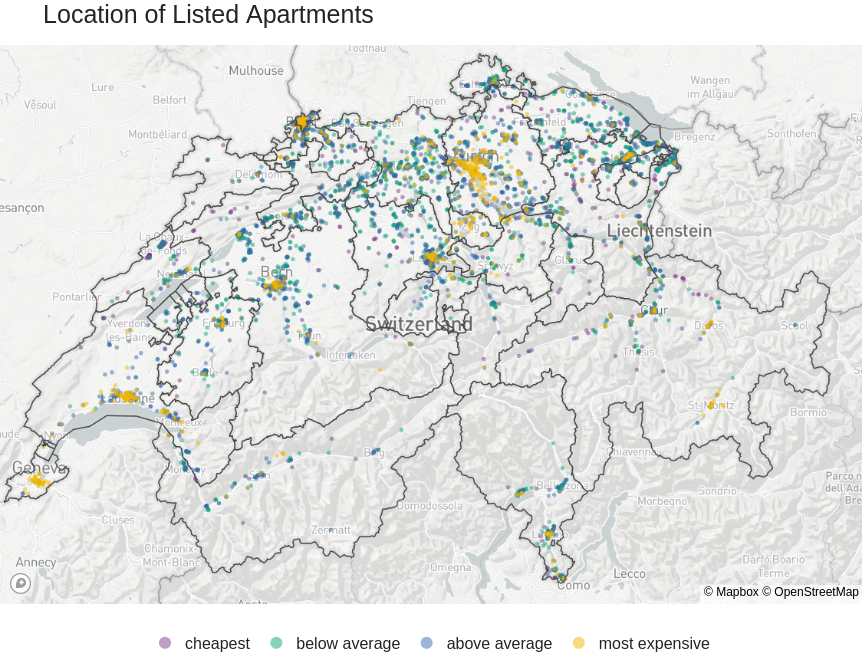

In [86]:
map_fig = build_scattermap(df_proc_small, mapbox_access_token)

map_fig

### Combining Figures: Scatter plot and bar plot

In [87]:
## Functions for the combined plot


def set_up_subplots():
    colors = px.colors.qualitative.Bold

    go_figure = make_subplots(
        rows=1,
        cols=2,
        subplot_titles=(
            "Apartments by Size and Rent",
            "Apartments per Canton",
        ),
        column_widths=[2, 1],
    )
    return go_figure, colors


def add_scatter_traces(df, go_figure, colors):
    for cat, df_grouped in df.groupby("Miete_Kategorie"):
        go_figure.add_trace(
            go.Scatter(
                x=df_grouped["Fläche"],
                y=df_grouped["Mietpreis_Brutto"],
                mode="markers",
                marker={"color": colors[cat], "opacity": 0.5},
                text=df_grouped["hover_strings_scatter"],
                hovertemplate="%{text}<extra></extra>",
                #   name=traces[cat],
                legendgroup=str(cat),
                showlegend=False,
            ),
            row=1,
            col=1,
        )
    return go_figure


def add_barplot_traces(df, go_figure, colors):
    df_grouped = (
        df.groupby(["Kanton", "Miete_Kategorie"])
        .size()
        .unstack(level=-1)
        .fillna(0)
        .sort_values("Kanton", ascending=False)
        .reset_index()
    )
    df_grouped["Total_Kanton"] = df_grouped.iloc[:, 1:].sum(axis=1)

    for cat in df["Miete_Kategorie"].unique():
        hover_strings = [
            f"{round(num_per_canton / total_canton * 100, 2)}%"
            for num_per_canton, total_canton in zip(
                df_grouped.loc[:, cat], df_grouped["Total_Kanton"]
            )
        ]
        go_figure.add_trace(
            go.Bar(
                y=df_grouped["Kanton"],
                x=df_grouped.loc[:, cat],
                orientation="h",
                marker_color=colors[cat],
                text=hover_strings,
                hovertemplate="%{text}<extra></extra>",
                #   name=traces[cat],
                legendgroup=str(cat),
                showlegend=False,
            ),
            row=1,
            col=2,
        )
    return go_figure


def define_figure_layout(go_figure):
    go_figure.update_layout(
        margin={"r": 0, "t": 45, "l": 0, "b": 0},
        width=875,
        height=550,
        hovermode="closest",
        template="simple_white",
        barmode="stack",
    )
    return go_figure


def build_combined_figure(df):
    go_figure, colors = set_up_subplots()

    # Scatter plot
    go_figure = add_scatter_traces(df, go_figure, colors)

    # Bar plot
    go_figure = add_barplot_traces(df, go_figure, colors)

    # Subplot title font size
    go_figure.layout.annotations[0].update(font_size=25, x=0.17, y=1.01)
    go_figure.layout.annotations[1].update(font_size=25, x=0.8, y=1.01)

    # Axis Labels
    go_figure.update_xaxes(
        title={"text": "Floor Space (m²)", "font_size": 16}, row=1, col=1
    )
    go_figure.update_yaxes(title={"text": "Rent (CHF)", "font_size": 16}, row=1, col=1)

    go_figure.update_xaxes(
        title={"text": "Number of Listings", "font_size": 16}, row=1, col=2
    )

    # Layout
    go_figure = define_figure_layout(go_figure)

    return go_figure

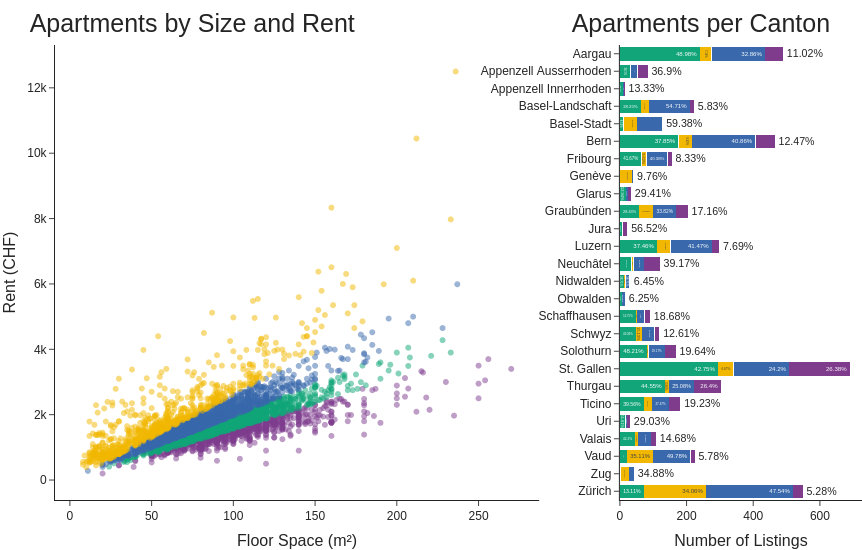

In [88]:
joint_fig = build_combined_figure(df=df_proc_small)

joint_fig.show()

<div style="border-top:0.1cm solid #EF475B"></div>
    <strong><a href='#Q0'><div style="text-align: right"> <h3>End of this Notebook.</h3></div></a></strong>